In [1]:
library(mashr)
library(dplyr)
library(tidyr)
library(vroom)

Loading required package: ashr


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# Load in summary stats (maybe find another way to do this for larger results)

In [2]:
cts <- c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')

In [83]:
in.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/'
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/mashr/'
dir.create(out.dir)

In [6]:
full.sum.stats <- list()

for (cell in cts) {
    full.sum.stats[[cell]] <- vroom(paste0(in.dir,cell,'.cis_qtl_pairs.chr.qvalue.tsv'))
}

summary(full.sum.stats)
dim(full.sum.stats[['Hepatocytes']])
head(full.sum.stats[['Hepatocytes']])

Rows: 26698524 Columns: 11
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...
lgl (1): sig.qtl

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 42591782 Columns: 11
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, af, ma_samples, ma_count, pval_nominal, slope, slop...
lgl (1): sig.qtl

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 58978117 Columns: 11
── Column specifi

              Length Class       Mode
B             11     spec_tbl_df list
Cholangiocyte 11     spec_tbl_df list
Endothelial   11     spec_tbl_df list
Hepatocytes   11     spec_tbl_df list
HSC           11     spec_tbl_df list
Myeloid       11     spec_tbl_df list
NK            11     spec_tbl_df list
T             11     spec_tbl_df list

[1] 77083441       11

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,sig.qtl,pval_nominal_threshold
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
AL627309.1,rs11240777,729856,0.32558140,45,56,0.9441913,0.01375403,0.1955488,FALSE,0.000123686
AL627309.1,rs4970383,769452,0.25000000,37,43,0.3174513,0.22042388,0.2184086,FALSE,0.000123686
AL627309.1,rs117039017,776170,0.05232558,9,9,0.6711700,-0.18069506,0.4232570,FALSE,0.000123686
AL627309.1,rs28612348,776975,0.18023255,27,31,0.6424008,0.10831322,0.2319248,FALSE,0.000123686
AL627309.1,rs4475691,777705,0.20348836,30,35,0.2312473,0.24885714,0.2054881,FALSE,0.000123686
AL627309.1,rs950122,777761,0.20348836,30,35,0.2312473,0.24885714,0.2054881,FALSE,0.000123686


In [7]:
for (cell in cts) {
    print(sum(full.sum.stats[[cell]]$sig.qtl))
}

[1] 653
[1] 8140
[1] 23747
[1] 75380
[1] 8952
[1] 27044
[1] 3710
[1] 3904


# Get lead signals

In [11]:
sig.signals <- data.frame()
for (cell in cts) {
    ct.res <- read.table(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/',cell,'.qvalue.cis_qtl.txt.gz'), header=T)
    ct.res$cell <- cell
    ct.res <- filter(ct.res, qval < 0.05)
    sig.signals <- rbind(sig.signals, ct.res)
}

dim(sig.signals)
head(sig.signals)

[1] 1644   20

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,ma_count,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,XRRA1,3212,1.05339,186.067,44.1796,1.08395e-08,rs12419929,-48810,-48810,45,62,0.360465,3.67336e-10,0.762540,0.0993221,9.999e-05,9.78317e-07,0.002259260,5.94354e-07,B
2,SNX19,4055,1.06387,346.816,44.9620,1.25546e-07,rs2236713,-46924,-46924,29,32,0.186047,9.31090e-09,1.097240,0.1612540,9.999e-05,2.22907e-05,0.030885900,3.50402e-07,B
3,ARL17B,4313,1.05284,107.421,42.7665,6.47831e-09,rs1378358,348149,348149,21,22,0.127907,9.93623e-11,1.391400,0.1732260,9.999e-05,3.21526e-07,0.001113770,1.02427e-06,B
4,PAX8-AS1,4030,1.04877,168.355,42.9526,3.23422e-07,rs1139015,27890,27890,46,54,0.313953,1.33598e-08,-0.974305,0.1452690,9.999e-05,3.30230e-05,0.038130500,6.29778e-07,B
5,C22orf34,6414,1.05805,572.155,45.1178,1.32445e-07,rs739241,1731,1731,46,61,0.645349,1.05170e-08,-0.828161,0.1223010,9.999e-05,4.25816e-05,0.042143600,2.01634e-07,B
6,C3orf70,3524,1.01919,273.121,44.6041,9.30118e-11,rs6783073,-189415,-189415,47,56,0.325581,1.58241e-12,1.149790,0.1253640,9.999e-05,1.80143e-08,0.000124803,2.93855e-07,B


In [38]:
sig.signals$feature_variant <- paste0(sig.signals$phenotype_id, ":", sig.signals$variant_id)

In [39]:
length(unique(sig.signals$feature_variant))

[1] 1503

In [43]:
sig.signals <- arrange(sig.signals, qval) %>%
    filter(!duplicated(feature_variant))
sig.signals

phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,⋯,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell,feature_variant
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AC253536.6,3787,1.04069,274.1630,46.0003,2.43534e-18,rs5751764,-61940,-61940,65,⋯,0.511628,6.47795e-21,-1.247890,0.0823248,9.999e-05,1.58289e-16,2.40180e-12,1.34082e-05,Hepatocytes,AC253536.6:rs5751764
XRRA1,3212,1.05968,169.5500,43.2518,8.47395e-17,rs12419929,-48810,-48810,45,⋯,0.360465,2.87891e-20,1.029830,0.0703391,9.999e-05,2.08898e-15,2.50350e-11,1.07751e-05,Endothelial,XRRA1:rs12419929
ENTPD3-AS1,3202,1.05137,124.4590,43.3866,3.51019e-16,rs11707673,-44216,-44216,42,⋯,0.284884,1.86698e-19,0.921139,0.0657577,9.999e-05,8.79823e-15,4.45001e-11,3.14104e-05,Hepatocytes,ENTPD3-AS1:rs11707673
SLC12A8,5300,1.03918,232.1580,43.4864,8.89486e-17,rs9815815,-5708,-5708,62,⋯,0.523256,3.86065e-20,1.012140,0.0696085,9.999e-05,5.90650e-15,4.45001e-11,1.56956e-05,Hepatocytes,SLC12A8:rs9815815
LINC01504,3577,1.04960,208.4530,44.6160,3.16371e-16,rs2310125,-4191,-4191,53,⋯,0.401163,5.18909e-19,1.144980,0.0837644,9.999e-05,1.43228e-14,8.58247e-11,8.21330e-06,Endothelial,LINC01504:rs2310125
CLHC1,4920,1.06778,207.0520,41.6788,8.14973e-16,rs17046778,-326,-326,32,⋯,0.197674,9.90310e-20,1.314820,0.0924570,9.999e-05,2.23102e-14,8.91240e-11,9.28899e-06,Endothelial,CLHC1:rs17046778
C2orf27A,2393,1.06381,91.4287,43.6298,1.29938e-15,rs6720375,34510,34510,56,⋯,0.581395,1.15229e-18,1.244940,0.0928531,9.999e-05,1.72942e-14,1.52249e-10,2.12874e-05,Myeloid,C2orf27A:rs6720375
PWP2,3098,1.04625,234.7430,43.8326,4.68823e-16,rs6518345,-50154,-50154,50,⋯,0.395349,4.04283e-19,1.021470,0.0742812,9.999e-05,2.71364e-14,1.52249e-10,7.41023e-06,Myeloid,PWP2:rs6518345
AP000350.6,3763,1.06141,237.2930,44.2774,1.12732e-15,rs5760119,17576,17576,64,⋯,0.523256,1.73917e-18,1.020210,0.0768586,9.999e-05,4.40059e-14,1.66931e-10,1.74407e-05,Hepatocytes,AP000350.6:rs5760119


# Extract lead signal summary stats

In [44]:
sig.signal.sum.stats <- list()

for (cell in cts) {
    full.sum.stats[[cell]]$feature_variant <- paste0(full.sum.stats[[cell]]$phenotype_id, ":", full.sum.stats[[cell]]$variant_id)
    sig.signal.sum.stats[[cell]] <- filter(full.sum.stats[[cell]], feature_variant %in% sig.signals$feature_variant)
}

summary(sig.signal.sum.stats)
dim(sig.signal.sum.stats[['Hepatocytes']])
head(sig.signal.sum.stats[['Hepatocytes']])

              Length Class       Mode
B             12     spec_tbl_df list
Cholangiocyte 12     spec_tbl_df list
Endothelial   12     spec_tbl_df list
Hepatocytes   12     spec_tbl_df list
HSC           12     spec_tbl_df list
Myeloid       12     spec_tbl_df list
NK            12     spec_tbl_df list
T             12     spec_tbl_df list

[1] 1423   12

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,sig.qtl,pval_nominal_threshold,feature_variant
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<chr>
SSU72,rs2453567,796169,0.5872093,53,71,7.337260e-01,0.03726539,0.10897276,FALSE,1.75275e-05,SSU72:rs2453567
PRKCZ,rs12410859,56882,0.3081395,42,53,3.405011e-01,0.12144443,0.12626345,FALSE,2.18004e-05,PRKCZ:rs12410859
CEP104,rs6663840,-30459,0.3953488,53,68,8.118765e-10,-0.57876650,0.07755246,TRUE,6.89665e-06,CEP104:rs6663840
C1orf174,rs6701422,-8686,0.6976744,37,52,2.041931e-09,0.80668885,0.11182539,TRUE,6.58593e-06,C1orf174:rs6701422
NPHP4,rs806111,1097,0.3953488,55,68,1.603828e-17,1.22295950,0.09733484,TRUE,1.44034e-05,NPHP4:rs806111
FHAD1,rs1780596,-79,0.3023256,42,52,6.948805e-01,0.06429074,0.16301586,FALSE,1.25280e-05,FHAD1:rs1780596


# Get variant:feature list and select a random set (vignette has 20k-200k)

In [45]:
feature_variant_list <- character()

for (cell in cts) {
    feature_variant_list <- unique(c(feature_variant_list, full.sum.stats[[cell]]$feature_variant))
}

length(feature_variant_list)
head(feature_variant_list)

[1] 84546859

[1] "LINC01409:rs11240777"  "LINC01409:rs4970383"   "LINC01409:rs117039017"
[4] "LINC01409:rs28612348"  "LINC01409:rs4475691"   "LINC01409:rs950122"

In [46]:
rand_feature_variant <- feature_variant_list[sample(1:nrow(full.sum.stats[[cell]]), size=100000, replace=F)]

dim(rand_feature_variant)
head(rand_feature_variant)

NULL

[1] "DHX29:rs11745168" "CFB:rs6457663"    "ADGRG5:rs9934509" "SNRNP70:rs7047"  
[5] "AKAP8L:rs2072598" "MTTP:rs1789896"

In [47]:
rand.signal.sum.stats <- list()

for (cell in cts) {
    rand.signal.sum.stats[[cell]] <- filter(full.sum.stats[[cell]], feature_variant %in% rand_feature_variant)
}

summary(rand.signal.sum.stats)
dim(rand.signal.sum.stats[['Hepatocytes']])
head(rand.signal.sum.stats[['Hepatocytes']])

              Length Class       Mode
B             12     spec_tbl_df list
Cholangiocyte 12     spec_tbl_df list
Endothelial   12     spec_tbl_df list
Hepatocytes   12     spec_tbl_df list
HSC           12     spec_tbl_df list
Myeloid       12     spec_tbl_df list
NK            12     spec_tbl_df list
T             12     spec_tbl_df list

[1] 98017    12

phenotype_id,variant_id,start_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,sig.qtl,pval_nominal_threshold,feature_variant
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<chr>
LINC01409,rs11581598,325690,0.2093023,32,36,0.4859257,-0.10550071,0.1503465,FALSE,4.93340e-05,LINC01409:rs11581598
LINC01409,rs9659213,414995,0.1046512,16,18,0.7049370,-0.07581762,0.1991457,FALSE,4.93340e-05,LINC01409:rs9659213
LINC01409,rs9439460,737363,0.1569767,24,27,0.8671913,0.03486069,0.2074545,FALSE,4.93340e-05,LINC01409:rs9439460
LINC01409,rs78721465,806426,0.1453488,23,25,0.5621638,0.11023880,0.1889908,FALSE,4.93340e-05,LINC01409:rs78721465
LINC01128,rs2710889,198435,0.3197675,49,55,0.4543975,0.09351627,0.1240853,FALSE,4.70887e-05,LINC01128:rs2710889
LINC01128,rs11260542,349501,0.0872093,14,15,0.2639408,-0.23049617,0.2041417,FALSE,4.70887e-05,LINC01128:rs11260542


# Create random mash object and estimate correlation

In [68]:
bhat_rand <- bind_rows(rand.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(bhat_rand)
head(bhat_rand)

[1] 100000      8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
LINC01409:rs11581598,-0.022489782,-0.03521677,0.30876034,-0.10550071,0.14738275,0.10909101,-0.140250440,-0.23301111
LINC01409:rs9659213,0.045454350,-0.01732023,-0.08736664,-0.07581762,-0.02155185,-0.13193917,0.001477709,-0.05354011
LINC01409:rs9439460,0.171170090,0.50083570,0.27842343,0.03486069,0.14650898,0.09400526,0.531605960,0.35721165
LINC01409:rs78721465,-0.005353748,0.08247352,0.13881618,0.11023880,0.31154323,0.19725047,0.357296760,0.21673931
C1orf159:rs74718486,0.172169390,-0.04324459,0.36106688,-0.19705859,-0.16932262,-0.12302399,-0.150990520,0.04397189
C1orf159:rs55717744,-0.136885930,0.04316598,-0.09231644,-0.01065632,0.01076376,-0.33021590,-0.197995530,0.16925265


In [69]:
shat_rand <- bind_rows(rand.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope_se) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope_se') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(shat_rand)
head(shat_rand)

[1] 100000      8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
LINC01409:rs11581598,0.1939527,0.1938308,0.2286042,0.1503465,0.2204178,0.2159175,0.2297397,0.1962437
LINC01409:rs9659213,0.2619122,0.2634929,0.2995010,0.1991457,0.3022110,0.2990850,0.2947922,0.2671471
LINC01409:rs9439460,0.2579221,0.2429299,0.3021878,0.2074545,0.3104549,0.2923780,0.2838146,0.2694479
LINC01409:rs78721465,0.2374375,0.2354576,0.2524260,0.1889908,0.2839452,0.2559841,0.2642421,0.2256192
C1orf159:rs74718486,0.2376278,0.1934908,0.1488820,0.1510994,0.1882041,0.1892744,0.2387396,0.2323994
C1orf159:rs55717744,0.2871717,0.2346008,0.1851549,0.1771537,0.2472645,0.2336004,0.2763182,0.2829717


In [70]:
sum(rownames(bhat_rand)==rownames(shat_rand)) == nrow(bhat_rand)
sum(colnames(bhat_rand)==colnames(shat_rand)) == ncol(bhat_rand)

[1] TRUE

[1] TRUE

In [71]:
random   = mash_set_data(bhat_rand, shat_rand)
random

$Bhat
                                     B Cholangiocyte   Endothelial
LINC01409:rs11581598     -2.248978e-02 -3.521677e-02  3.087603e-01
LINC01409:rs9659213       4.545435e-02 -1.732023e-02 -8.736664e-02
LINC01409:rs9439460       1.711701e-01  5.008357e-01  2.784234e-01
LINC01409:rs78721465     -5.353748e-03  8.247352e-02  1.388162e-01
C1orf159:rs74718486       1.721694e-01 -4.324459e-02  3.610669e-01
C1orf159:rs55717744      -1.368859e-01  4.316598e-02 -9.231644e-02
C1orf159:rs1262894        5.168738e-01 -3.818809e-01  1.209374e-01
C1orf159:rs17363048      -8.828769e-02  3.041986e-01 -1.484259e-01
C1orf159:rs6663586        1.139852e-01  1.105623e-03  1.155350e-01
C1orf159:rs12125178       1.838674e-01 -1.607390e-02 -2.821664e-01
C1orf159:rs147165091     -1.370498e-01  6.585231e-02 -1.300604e-01
C1orf159:rs867308        -1.213404e-01 -8.890511e-02 -1.468073e-01
SDF4:rs6696281            1.285361e-01  3.381203e-01 -3.240588e-02
SDF4:rs111818913          9.210058e-02 -4.962288e-03  2.

In [72]:
Vhat = estimate_null_correlation_simple(random)
Vhat

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
B,1.00000000,0.03421210,0.03668106,0.05019499,0.02464465,0.04292700,0.01903841,0.02576903
Cholangiocyte,0.03421210,1.00000000,0.06023178,0.09783993,0.06114712,0.04839141,0.03014957,0.02823078
Endothelial,0.03668106,0.06023178,1.00000000,0.09808997,0.11127679,0.09651500,0.03997865,0.04344864
Hepatocytes,0.05019499,0.09783993,0.09808997,1.00000000,0.09514174,0.08461857,0.02915463,0.02852300
HSC,0.02464465,0.06114712,0.11127679,0.09514174,1.00000000,0.07115609,0.02191318,0.03349350
Myeloid,0.04292700,0.04839141,0.09651500,0.08461857,0.07115609,1.00000000,0.03530211,0.04496645
NK,0.01903841,0.03014957,0.03997865,0.02915463,0.02191318,0.03530211,1.00000000,0.05614614
T,0.02576903,0.02823078,0.04344864,0.02852300,0.03349350,0.04496645,0.05614614,1.00000000


# Recreate random and make strong with correlation matrix from the null (random)

In [65]:
bhat_strong <- bind_rows(sig.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(bhat_strong)
head(bhat_strong)

[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
SSU72:rs2453567,-0.09297028,0.2026145600,0.52093390,0.03726539,0.117632190,0.03037467,-0.15690070,-0.045692280
PRKCZ:rs12410859,0.06687541,-0.1231881300,-0.24597783,0.12144443,0.175625000,0.64562930,0.22936441,-0.006546049
CEP104:rs6663840,-0.26699764,-0.4993021000,0.03328211,-0.57876650,-0.157849600,-0.47269900,-0.18007258,0.084000500
NPHP4:rs806111,0.10066497,-0.0006824732,0.03251780,1.22295950,0.099456206,-0.15886970,NA,NA
EYA3:rs6598888,0.13897868,0.3182151000,0.26965496,-0.31252000,0.002263902,1.25600950,0.08561976,-0.238872240
EYA3:rs12139137,0.04223248,-0.2295453800,0.19889174,-0.51014860,-0.041915562,0.40127984,-0.06449355,-0.126848160


In [63]:
shat_strong <- bind_rows(sig.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope_se) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope_se') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(shat_strong)
head(shat_strong)

[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
SSU72:rs2453567,0.1540644,0.1467575,0.09626815,0.10897276,0.1308438,0.1474095,0.1507815,0.1497897
PRKCZ:rs12410859,0.1683061,0.1610683,0.15130454,0.12626345,0.1445126,0.1157280,0.1457822,0.1584067
CEP104:rs6663840,0.1567693,0.1532393,0.11596132,0.07755246,0.1238403,0.1180731,0.1524235,0.1442093
NPHP4:rs806111,0.1819448,0.2050960,0.16358736,0.09733484,0.2003130,0.1541505,NA,NA
EYA3:rs6598888,0.2608451,0.3348020,0.25444314,0.21617890,0.2618076,0.1940966,0.1922235,0.2995428
EYA3:rs12139137,0.1495473,0.1942880,0.12387583,0.09616438,0.1434535,0.1277511,0.1118925,0.1682167


In [66]:
sum(rownames(bhat_strong)==rownames(shat_strong)) == nrow(bhat_strong)
sum(colnames(bhat_strong)==colnames(shat_strong)) == ncol(bhat_strong)

[1] TRUE

[1] TRUE

In [73]:
strong   = mash_set_data(bhat_strong, shat_strong, V = Vhat)
strong

$Bhat
                                    B Cholangiocyte   Endothelial   Hepatocytes
SSU72:rs2453567         -9.297028e-02  0.2026145600  0.5209339000  0.0372653860
PRKCZ:rs12410859         6.687541e-02 -0.1231881300 -0.2459778300  0.1214444300
CEP104:rs6663840        -2.669976e-01 -0.4993021000  0.0332821100 -0.5787665000
NPHP4:rs806111           1.006650e-01 -0.0006824732  0.0325178020  1.2229595000
EYA3:rs6598888           1.389787e-01  0.3182151000  0.2696549600 -0.3125200000
EYA3:rs12139137          4.223248e-02 -0.2295453800  0.1988917400 -0.5101486000
PHACTR4:rs4654389       -1.032300e-01 -0.0623913930 -0.0334081600  0.0382730630
EPB41:rs492313           2.554526e-01  0.0386945500 -1.1725802000  0.4355446400
PPIE:rs12074147          7.188260e-01  0.6820675000  1.2650075000  1.3388743000
PPIE:rs7518431           7.164424e-01  0.6916991000  1.2188358000  1.3105699000
MKNK1:rs10890405         1.191033e-01  0.2551283000  0.1902562400  0.6049732600
SSBP3:rs213479           5.770654e

In [74]:
random   = mash_set_data(bhat_rand, shat_rand, V=Vhat)
random

$Bhat
                                     B Cholangiocyte   Endothelial
LINC01409:rs11581598     -2.248978e-02 -3.521677e-02  3.087603e-01
LINC01409:rs9659213       4.545435e-02 -1.732023e-02 -8.736664e-02
LINC01409:rs9439460       1.711701e-01  5.008357e-01  2.784234e-01
LINC01409:rs78721465     -5.353748e-03  8.247352e-02  1.388162e-01
C1orf159:rs74718486       1.721694e-01 -4.324459e-02  3.610669e-01
C1orf159:rs55717744      -1.368859e-01  4.316598e-02 -9.231644e-02
C1orf159:rs1262894        5.168738e-01 -3.818809e-01  1.209374e-01
C1orf159:rs17363048      -8.828769e-02  3.041986e-01 -1.484259e-01
C1orf159:rs6663586        1.139852e-01  1.105623e-03  1.155350e-01
C1orf159:rs12125178       1.838674e-01 -1.607390e-02 -2.821664e-01
C1orf159:rs147165091     -1.370498e-01  6.585231e-02 -1.300604e-01
C1orf159:rs867308        -1.213404e-01 -8.890511e-02 -1.468073e-01
SDF4:rs6696281            1.285361e-01  3.381203e-01 -3.240588e-02
SDF4:rs111818913          9.210058e-02 -4.962288e-03  2.

In [84]:
saveRDS(random, paste0(out.dir, '241125_WE_100k_random_mashr.RDS'))
saveRDS(strong, paste0(out.dir, '241125_WE_lead_mashr.RDS'))

# Get data driven covariance on the strong

In [75]:
U.pca = cov_pca(strong,5)
U.ed = cov_ed(strong, U.pca)

In [85]:
saveRDS(U.pca, paste0(out.dir, '241125_WE_U.pca.RDS'))
saveRDS(U.ed, paste0(out.dir, '241125_WE_U.ed.RDS'))

# Fit mash to the null set

In [76]:
U.c = cov_canonical(random)
m = mash(random, Ulist = c(U.ed,U.c), outputlevel = 1)

 - Computing 100000 x 400 likelihood matrix.
 - Likelihood calculations took 64.27 seconds.
 - Fitting model with 400 mixture components.
 - Model fitting took 366.23 seconds.


In [86]:
saveRDS(U.c, paste0(out.dir, '241125_WE_U.c.RDS'))
saveRDS(m, paste0(out.dir, '241125_WE_fit_model_m.RDS'))

# Estimate posteriors for set  
Run this again on any additional summary stats we want to estimate, could eventually loop through all

In [77]:
m2 = mash(strong, g=get_fitted_g(m), fixg=TRUE)

 - Computing 1503 x 400 likelihood matrix.
 - Likelihood calculations took 0.94 seconds.
 - Computing posterior matrices.
 - Computation allocated took 0.20 seconds.


In [87]:
saveRDS(m2, paste0(out.dir, '241125_WE_lead_estimates_m2.RDS'))

In [95]:
write.table(get_lfsr(m2), paste0(out.dir, '241125_WE_lead_lfsr.tsv'), 
            sep='\t', quote=F, col.names=T, row.names=T)
write.table(get_pm(m2), paste0(out.dir, '241125_WE_lead_post_mean.tsv'), 
            sep='\t', quote=F, col.names=T, row.names=T)
write.table(get_psd(m2), paste0(out.dir, '241125_WE_lead_post_sd.tsv'), 
            sep='\t', quote=F, col.names=T, row.names=T)

In [94]:
head(get_lfsr(m2))

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
SSU72:rs2453567,0.85606196,0.7564693130,0.002059214,8.044823e-01,0.75109479,8.000281e-01,0.82743669,0.8554969
PRKCZ:rs12410859,0.74124829,0.8037397920,0.771105147,7.206494e-01,0.72054650,6.924803e-04,0.69942062,0.7531656
CEP104:rs6663840,0.02838375,0.0006151098,0.279442236,3.142286e-11,0.01481013,1.016553e-04,0.05156686,0.1534803
NPHP4:rs806111,0.99539618,0.9950323482,0.995736691,3.178123e-31,0.99523688,9.969058e-01,0.99559178,0.9956309
EYA3:rs6598888,0.95500011,0.9555617176,0.950026180,9.607890e-01,0.95646387,4.407864e-05,0.95602096,0.9626096
EYA3:rs12139137,0.44891117,0.1296896460,0.125986873,6.422787e-05,0.39114895,2.882506e-02,0.29221765,0.3030239


In [78]:
summary(m)

                  Length  Class  Mode   
result                  0 -none- NULL   
loglik                  1 -none- numeric
vloglik            100000 -none- numeric
null_loglik        100000 -none- numeric
alt_loglik         100000 -none- numeric
fitted_g                4 -none- list   
posterior_weights 3300000 -none- numeric
alpha                   1 -none- numeric

In [79]:
summary(m2)

                  Length Class  Mode   
result                4  -none- list   
loglik                1  -none- numeric
vloglik            1503  -none- numeric
null_loglik        1503  -none- numeric
alt_loglik         1503  -none- numeric
fitted_g              4  -none- list   
posterior_weights 49599  -none- numeric
alpha                 1  -none- numeric

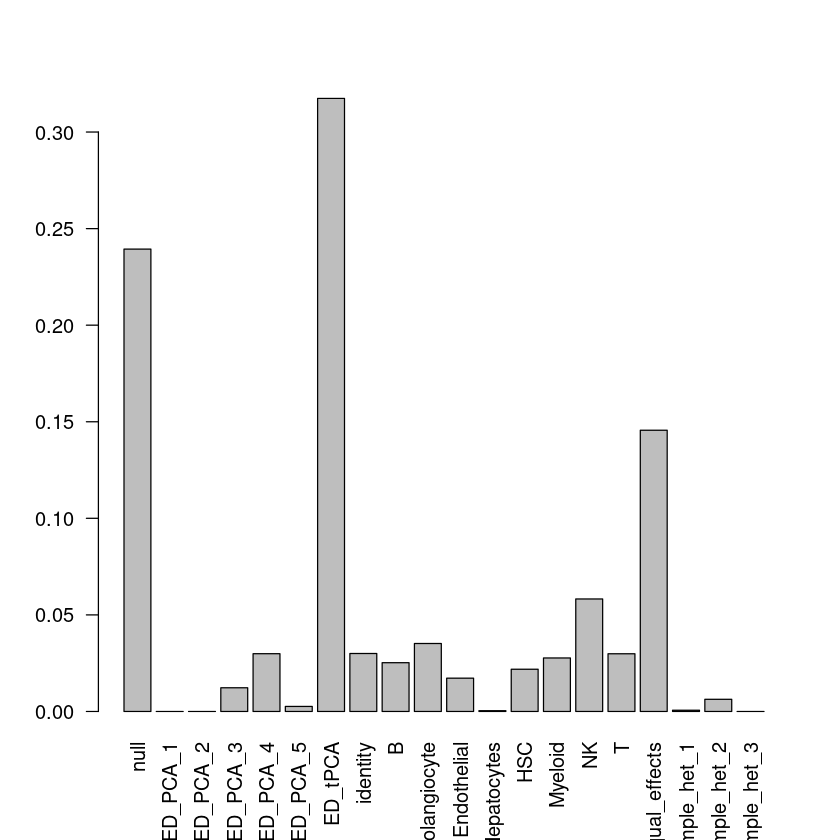

In [81]:
barplot(get_estimated_pi(m2),las = 2)

In [88]:
print(get_pairwise_sharing(m2, factor=0))

                      B Cholangiocyte Endothelial Hepatocytes       HSC
B             1.0000000     0.9906915   0.9776995   0.9799833 0.9858793
Cholangiocyte 0.9906915     1.0000000   0.9744728   0.9868960 0.9752169
Endothelial   0.9776995     0.9744728   1.0000000   0.9519520 0.9713971
Hepatocytes   0.9799833     0.9868960   0.9519520   1.0000000 0.9695757
HSC           0.9858793     0.9752169   0.9713971   0.9695757 1.0000000
Myeloid       0.9821641     0.9646409   0.9576613   0.9392348 0.9630033
NK            0.9968504     0.9855263   0.9742389   0.9759336 0.9835025
T             0.9937304     0.9869622   0.9696262   0.9743590 0.9784810
                Myeloid        NK         T
B             0.9821641 0.9968504 0.9937304
Cholangiocyte 0.9646409 0.9855263 0.9869622
Endothelial   0.9576613 0.9742389 0.9696262
Hepatocytes   0.9392348 0.9759336 0.9743590
HSC           0.9630033 0.9835025 0.9784810
Myeloid       1.0000000 0.9785969 0.9774347
NK            0.9785969 1.0000000 1.0000000


In [92]:
data.frame(matrix(as.numeric(get_lfsr(m2) < .01), ncol=8))

X1,X2,X3,X4,X5,X6,X7,X8
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,0,1,0,0,0,0,0
0,0,0,0,0,1,0,0
0,1,0,1,0,1,0,0
0,0,0,1,0,0,0,0
0,0,0,0,0,1,0,0
0,0,0,1,0,0,0,0
0,0,0,0,0,1,0,0
0,0,1,0,0,0,0,0
1,1,1,1,1,1,1,1


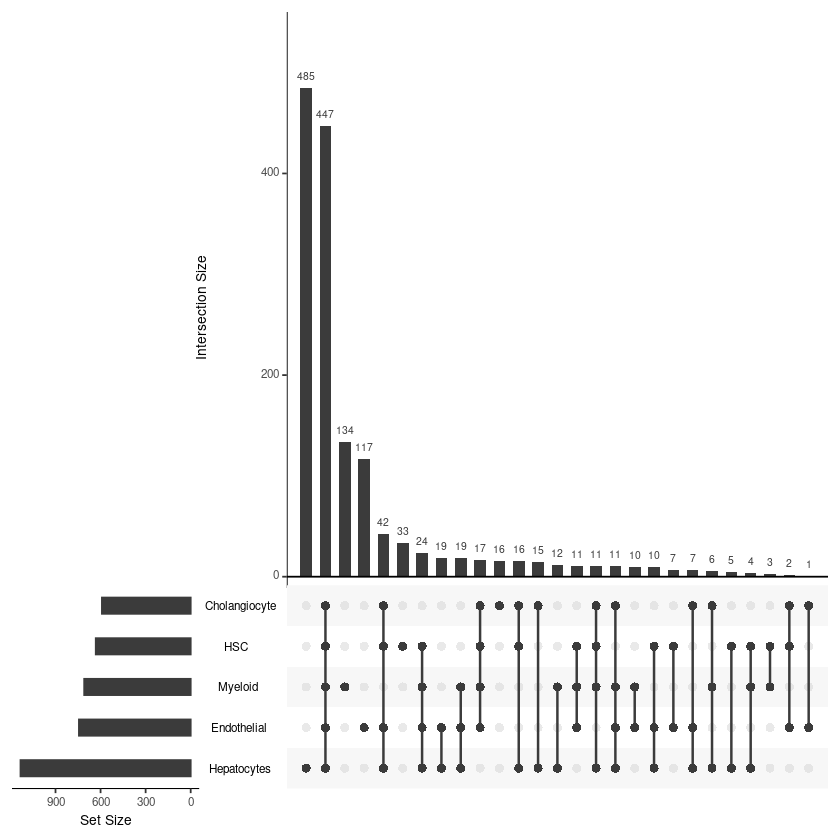

In [93]:
library(UpSetR)

upset_data <- data.frame(matrix(as.numeric(get_lfsr(m2) < .01), ncol=8))
colnames(upset_data) <- colnames(get_lfsr(m2))

upset(upset_data, order.by = "freq")

In [2]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

library(UpSetR)

pdf('/nfs/lab/welison/Liver/Plots/241213_WE_RNA_QTL_Specificifty_Upset.pdf', height=6, width=10)

upset_data <- data.frame(matrix(as.numeric(lfsr < .01), ncol=8))
colnames(upset_data) <- colnames(lfsr)

upset(upset_data, order.by = "freq", text.scale = 2, nintersects=15)

dev.off()

[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SSU72:rs2453567,0.85606196,0.7564693130,0.002059214,8.044823e-01,0.75109479,8.000281e-01,0.82743669,0.8554969
PRKCZ:rs12410859,0.74124829,0.8037397920,0.771105147,7.206494e-01,0.72054650,6.924803e-04,0.69942062,0.7531656
CEP104:rs6663840,0.02838375,0.0006151098,0.279442236,3.142286e-11,0.01481013,1.016553e-04,0.05156686,0.1534803
NPHP4:rs806111,0.99539618,0.9950323482,0.995736691,3.178123e-31,0.99523688,9.969058e-01,0.99559178,0.9956309
EYA3:rs6598888,0.95500011,0.9555617176,0.950026180,9.607890e-01,0.95646387,4.407864e-05,0.95602096,0.9626096
EYA3:rs12139137,0.44891117,0.1296896460,0.125986873,6.422787e-05,0.39114895,2.882506e-02,0.29221765,0.3030239


png 
  2